In [1]:
import os
import rasterio
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import balanced_accuracy_score, cohen_kappa_score
from sklearn.model_selection import StratifiedKFold
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import numpy as np
from shapely.geometry import mapping
import geopandas as gpd

In [2]:
import os # we need os to do some basic file operations

sentinal_fp = "C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/"
# find every file in the sentinal_fp directory
sentinal_band_paths = [os.path.join(sentinal_fp, f) for f in os.listdir(sentinal_fp) if os.path.isfile(os.path.join(sentinal_fp, f))]
sentinal_band_paths.sort()
sentinal_band_paths

['C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/Image_bbox01.tif',
 'C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/Image_bbox01.tif.ovr',
 'C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/Image_bbox012.tif',
 'C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/class_raster.tif',
 'C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/goeggingen.tif',
 'C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/goeggingen.tif.aux.xml',
 'C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/goeggingen.tif.ovr',
 'C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/goegingen_pro.tif',
 'C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/satellite_prompts.tif',
 'C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/satellite_prompts2.tif']

In [3]:
#file_path = 'C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/data/osm_all.geojson'
file_path = 'C:/Users/leoni/Documents/Uni/UGS/Project/Funktionert/data/goeggingen_merge.shp'
data = gpd.read_file(file_path)
data

,OBJECTID,osmid,class,geom_Lengt,geom_Area,value,Shape_Leng,Shape_Area,geometry
0,1.0,34995210.0,recreation_ground,0.001187,6.011116e-08,0.0,0.001187,6.011104e-08,"POLYGON ((10.86834 48.35136, 10.86819 48.35118..."
1,2.0,69217096.0,recreation_ground,0.003760,3.623313e-07,0.0,0.003760,3.623316e-07,"POLYGON ((10.86053 48.34204, 10.86034 48.34172..."
2,3.0,403287451.0,recreation_ground,0.003043,4.437459e-07,0.0,0.003043,4.437458e-07,"POLYGON ((10.85867 48.33885, 10.85856 48.33875..."
3,4.0,37104444.0,grass,0.003839,6.745710e-07,0.0,0.003839,6.745711e-07,"POLYGON ((10.86042 48.34162, 10.86006 48.34137..."
4,5.0,48164805.0,grass,0.005284,6.108334e-07,0.0,0.005284,6.108332e-07,"POLYGON ((10.86454 48.34256, 10.86453 48.34251..."
...,...,...,...,...,...,...,...,...,...
609,0.0,0.0,grave,0.000000,0.000000e+00,255.0,0.000095,4.207945e-10,"POLYGON ((10.86779 48.34496, 10.86779 48.34496..."
610,0.0,0.0,grave,0.000000,0.000000e+00,255.0,0.000107,6.216258e-10,"POLYGON ((10.86790 48.34496, 10.86792 48.34496..."
611,0.0,0.0,grave,0.000000,0.000000e+00,255.0,0.000116,5.833541e-10,"POLYGON ((10.86707 48.34495, 10.86707 48.34495..."
612,0.0,0.0,grave,0.000000,0.000000e+00,255.0,0.000095,3.681662e-10,"POLYGON ((10.86744 48.34494, 10.86746 48.34494..."


In [4]:
data.explore()

In [5]:
# create a products directory within the data dir which won't be uploaded to Github
img_dir = 'C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/'

# check to see if the dir it exists, if not, create it
if not os.path.exists(img_dir):
    os.makedirs(img_dir)

# filepath for image we're writing out
img_fp = img_dir + 'goeggingen.tif'

# Read metadata of first file and assume all other bands are the same
with rasterio.open(sentinal_band_paths[0]) as src0:
    meta = src0.meta

# Update metadata to reflect the number of layers
meta.update(count = len(sentinal_band_paths))

In [6]:
full_dataset = rasterio.open(img_fp)
img_rows, img_cols = full_dataset.shape
img_bands = full_dataset.count
print(full_dataset.shape) # dimensions
print(full_dataset.count) # bands

(7909, 8650)
3


In [7]:
full_dataset = rasterio.open(img_fp)
raster_crs = full_dataset.crs

In [8]:
from rasterio.warp import calculate_default_transform, reproject, Resampling

# Define the source and destination coordinate reference systems
src_crs = 'EPSG:32632'
dst_crs = 'EPSG:4326'

# Open the original dataset
with rasterio.open('C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/goeggingen.tif') as src:
    # Calculate the transform and dimensions for the new dataset
    transform, width, height = calculate_default_transform(
        src.crs, dst_crs, src.width, src.height, *src.bounds)
    
    # Define the metadata for the new dataset
    kwargs = src.meta.copy()
    kwargs.update({
        'crs': dst_crs,
        'transform': transform,
        'width': width,
        'height': height
    })

    # Create the new dataset and reproject the original data into it
    with rasterio.open('C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/goegingen_pro.tif', 'w', **kwargs) as dst:
        for i in range(1, src.count + 1):  # Loop through all bands
            reproject(
                source=rasterio.band(src, i),
                destination=rasterio.band(dst, i),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=dst_crs,
                resampling=Resampling.nearest)

In [9]:
shapefile = gpd.read_file('C:/Users/leoni/Documents/Uni/UGS/Project/Funktionert/data/goeggingen_merge.shp')
shapefile.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [10]:
shapefile = shapefile.to_crs(epsg=32632)
shapefile.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [11]:
shapefile

,OBJECTID,osmid,class,geom_Lengt,geom_Area,value,Shape_Leng,Shape_Area,geometry
0,1.0,34995210.0,recreation_ground,0.001187,6.011116e-08,0.0,0.001187,6.011104e-08,"POLYGON ((638418.168 5357040.085, 638407.425 5..."
1,2.0,69217096.0,recreation_ground,0.003760,3.623313e-07,0.0,0.003760,3.623316e-07,"POLYGON ((637864.666 5355990.298, 637851.396 5..."
2,3.0,403287451.0,recreation_ground,0.003043,4.437459e-07,0.0,0.003043,4.437458e-07,"POLYGON ((637735.566 5355632.803, 637727.565 5..."
3,4.0,37104444.0,grass,0.003839,6.745710e-07,0.0,0.003839,6.745711e-07,"POLYGON ((637857.641 5355943.107, 637831.756 5..."
4,5.0,48164805.0,grass,0.005284,6.108334e-07,0.0,0.005284,6.108332e-07,"POLYGON ((638160.506 5356054.803, 638159.554 5..."
...,...,...,...,...,...,...,...,...,...
609,0.0,0.0,grave,0.000000,0.000000e+00,255.0,0.000095,4.207945e-10,"POLYGON ((638394.604 5356328.221, 638394.803 5..."
610,0.0,0.0,grave,0.000000,0.000000e+00,255.0,0.000107,6.216258e-10,"POLYGON ((638402.569 5356327.820, 638404.160 5..."
611,0.0,0.0,grave,0.000000,0.000000e+00,255.0,0.000116,5.833541e-10,"POLYGON ((638341.160 5356325.928, 638341.359 5..."
612,0.0,0.0,grave,0.000000,0.000000e+00,255.0,0.000095,3.681662e-10,"POLYGON ((638368.624 5356325.209, 638370.015 5..."


In [12]:
shapefile = shapefile.to_crs({'init': 'epsg:4326'})
shapefile.crs

c:\Users\leoni\Programme\Miniconda\envs\geo\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


<Geographic 2D CRS: +init=epsg:4326 +type=crs>
Name: WGS 84
Axis Info [ellipsoidal]:
- lon[east]: Longitude (degree)
- lat[north]: Latitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [13]:
# this generates a list of shapely geometries
geoms = shapefile.geometry.values 

# let's grab a single shapely geometry to check
geometry = geoms[0] 
print(type(geometry))
print(geometry)

# transform to GeoJSON format
from shapely.geometry import mapping
feature = [mapping(geometry)] # can also do this using polygon.__geo_interface__
print(type(feature))
print(feature)

<class 'shapely.geometry.polygon.Polygon'>
POLYGON ((10.868342999629759 48.35135819992104, 10.868191400013131 48.351177900239975, 10.868132900013393 48.351179599958634, 10.868118400244045 48.35118920022149, 10.868145200040999 48.35122150027205, 10.868130399898064 48.35134139968591, 10.86820251743228 48.35149824414873, 10.86851823073181 48.351498231558196, 10.868342999629759 48.35135819992104))
<class 'list'>
[{'type': 'Polygon', 'coordinates': (((10.868342999629759, 48.35135819992104), (10.868191400013131, 48.351177900239975), (10.868132900013393, 48.351179599958634), (10.868118400244045, 48.35118920022149), (10.868145200040999, 48.35122150027205), (10.868130399898064, 48.35134139968591), (10.86820251743228, 48.35149824414873), (10.86851823073181, 48.351498231558196), (10.868342999629759, 48.35135819992104)),)}]


In [14]:
full_dataset.close()

In [27]:
import geopandas as gpd
import rasterio
from rasterio.mask import mask
from shapely.geometry import mapping
from shapely.geometry import box


# Load the shapefile
#shapefile = gpd.read_file(shapefile_path)

# Check if the CRS matches, if not, reproject
if shapefile.crs != raster_crs:
    shapefile = shapefile.to_crs(raster_crs)

# Check that geometries are valid
shapefile['valid'] = shapefile.is_valid
shapefile = shapefile[shapefile['valid']]


with rasterio.open('C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/goegingen_pro.tif') as src:
    raster_bounds = src.bounds
    raster_bbox = box(*raster_bounds)  # Create a bounding box from the raster bounds

    # Only proceed if the raster and shapefile overlap
    if not shapefile.unary_union.intersects(raster_bbox):
        raise ValueError("Shapefile and raster do not overlap")
    else:
        print("The shapefile and raster overlap.")

    # Extract the raster values within the polygon
    for geom in shapefile.geometry:
        feature = [mapping(geom)]
        out_image, out_transform = mask(src, feature, crop=True)
        # process out_image

ValueError: Shapefile and raster do not overlap

In [15]:
# Reproject the shapefile to match the raster's CRS
shapefile = shapefile.to_crs(epsg=32632)

In [16]:
with rasterio.open('C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/goegingen_pro.tif') as src:
    print(src.bounds)
print(shapefile.total_bounds)

BoundingBox(left=10.8498, bottom=48.33740067665543, right=10.8730000694298, top=48.351499999999994)
[ 637044.26852859 5355464.36639753  638799.87366649 5357061.94037001]


In [17]:
shapefile = shapefile.to_crs("EPSG:4326")
print(shapefile.total_bounds)
shapefile.crs

[10.84979875 48.33740369 10.87299742 48.35149895]


<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

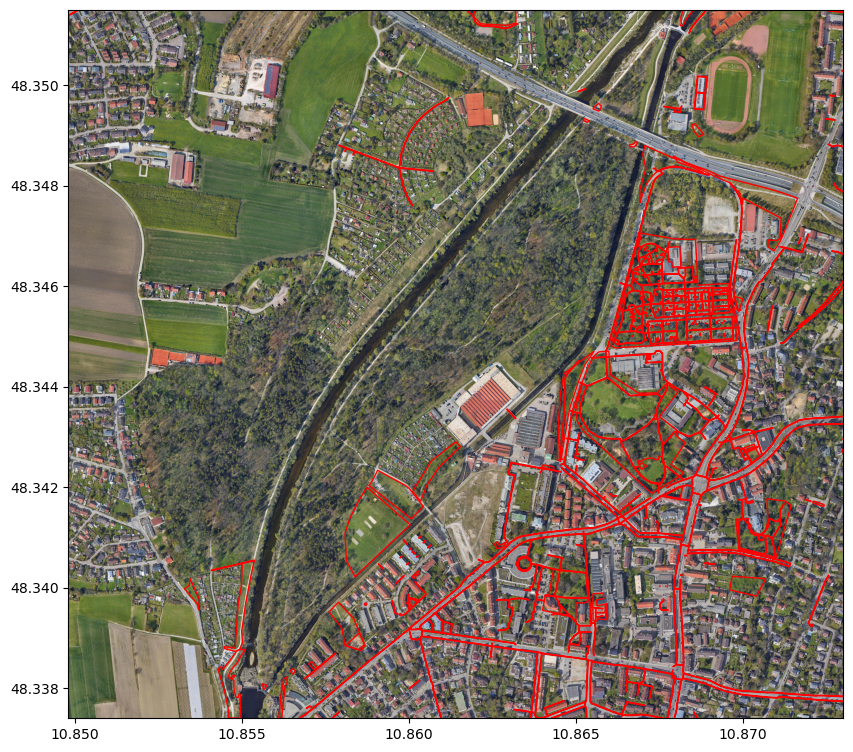

In [18]:
import matplotlib.pyplot as plt
import rasterio
import rasterio.plot

fig, ax = plt.subplots(figsize=(10, 10))
with rasterio.open('C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/goegingen_pro.tif') as src:
    rasterio.plot.show(src, ax=ax)
shapefile.plot(ax=ax, facecolor='none', edgecolor='red')
plt.show()

In [19]:
from shapely.geometry import box
from shapely.affinity import scale

# Open the raster file and get its bounds
with rasterio.open('C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/goegingen_pro.tif') as src:
    bounds = src.bounds

# Create a slightly smaller bounding box geometry from the raster bounds
# Reduce each side of the bounding box by a small fraction, e.g., 0.99 to reduce by 1%
smaller_bbox = scale(box(bounds.left, bounds.bottom, bounds.right, bounds.top), xfact=0.99, yfact=0.99, origin='center')

# Create a GeoDataFrame from the smaller bounding box
smaller_bbox_gdf = gpd.GeoDataFrame({'geometry': [smaller_bbox]}, crs=src.crs)

# Make sure the shapefile is in the same CRS as the raster
shapefile = shapefile.to_crs(src.crs)

# Perform a spatial join to find features completely within the smaller bounding box
within_shapefile = gpd.sjoin(shapefile, smaller_bbox_gdf, op='within')

# Save the clipped shapefile to a new file
within_shapefile.to_file('within_shapefile_goeggingen.gpkg', driver='GPKG')

c:\Users\leoni\Programme\Miniconda\envs\geo\Lib\site-packages\IPython\core\interactiveshell.py:3466: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


In [20]:
shapefile = within_shapefile

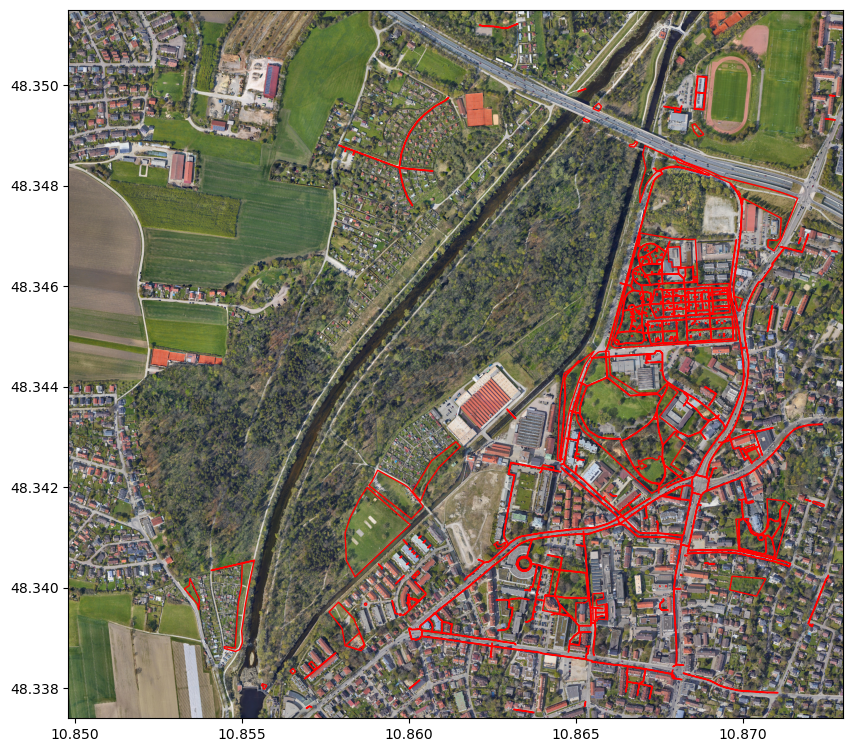

In [21]:
import matplotlib.pyplot as plt
import rasterio
import rasterio.plot

fig, ax = plt.subplots(figsize=(10, 10))
with rasterio.open('C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/goegingen_pro.tif') as src:
    rasterio.plot.show(src, ax=ax)
shapefile.plot(ax=ax, facecolor='none', edgecolor='red')
plt.show()

In [22]:
shapefile = shapefile.to_crs("EPSG:4326")
shapefile.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [23]:
from rasterio.mask import mask
from shapely.geometry import mapping
from shapely.geometry import box

with rasterio.open('C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/goegingen_pro.tif') as src:
    raster_bounds = src.bounds
    raster_bbox = box(*raster_bounds)  # Create a bounding box from the raster bounds

    # Only proceed if the raster and shapefile overlap
    if not shapefile.unary_union.intersects(raster_bbox):
        raise ValueError("Shapefile and raster do not overlap")
    else:
        print("The shapefile and raster overlap.")

    # Extract the raster values within the polygon
    for geom in shapefile.geometry:
        feature = [mapping(geom)]
        out_image, out_transform = mask(src, feature, crop=True)

The shapefile and raster overlap.


In [24]:
import numpy as np

# Initialize a list to hold the mean values for each band
band_means = []

# Extract the raster values within the polygon
for geom in shapefile.geometry:
    feature = [mapping(geom)]
    
    with rasterio.open('C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/goegingen_pro.tif') as src:
        out_image, out_transform = mask(src, feature, crop=True)
        
        # Calculate mean of each band, excluding no-data values
        means = np.ma.array(out_image, mask=out_image == src.nodata).mean(axis=(1, 2))
        band_means.append(means.filled(src.nodata))

In [25]:
import numpy as np
import rasterio
from rasterio.mask import mask
from shapely.geometry import mapping
import geopandas as gpd
from rasterio.features import geometry_mask

img_fp = 'C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/goegingen_pro.tif'

X = np.array([], dtype=np.float32).reshape(0, 3)  # Replace '8' with the actual number of bands if different
y = []  # Initialize y as an empty list

incomplete_features = []

with rasterio.open(img_fp) as src:
    raster_crs = src.crs
    nodata = src.nodatavals[0]  # Assuming all bands have the same nodata value
    band_count = src.count

    # Iterate over the geometries in the shapefile
    for index, row in shapefile.iterrows():
        geom = row['geometry']
        # Create a mask for the current geometry
        geom_mask = geometry_mask([geom], transform=src.transform, invert=True, out_shape=(src.height, src.width))

        # Check if the geometry intersects with the raster
        if not geom_mask.all():
            out_image, out_transform = mask(src, [geom], crop=True, nodata=nodata)
            out_image_masked = np.ma.masked_equal(out_image, nodata)
            valid_data = out_image_masked.compressed()

            # Ensure we have a complete set of pixels for all bands
            if valid_data.size % band_count == 0:
                out_image_reshaped = valid_data.reshape(-1, band_count)

                # Remove rows that contain nodata values
                valid_rows = np.all(out_image_reshaped != nodata, axis=1)
                out_image_reshaped = out_image_reshaped[valid_rows]

                # Only proceed if we have valid data left after removing nodata rows
                if out_image_reshaped.size > 0:
                    X = np.vstack((X, out_image_reshaped))
                    y.extend([row['class']] * out_image_reshaped.shape[0])
            else:
                # Collect indices of incomplete features to handle later
                incomplete_features.append(index)
                print(f"Feature {index} does not have a complete set of pixels.")

# Handle incomplete features as needed
# For example, you might want to drop them from the shapefile
shapefile = shapefile.drop(incomplete_features)

In [26]:
# Initialize empty arrays for the pixel values and labels
X = np.array([], dtype=np.float32).reshape(0, 3)  # Replace '8' with the number of bands
y = []

with rasterio.open(img_fp) as src:
    # Ensure the shapefile is in the same CRS as the raster
    shapefile = shapefile.to_crs(src.crs)
    nodata = src.nodatavals[0]  # Assuming all bands have the same nodata value

    # Loop through each feature in the shapefile
    for index, row in shapefile.iterrows():
        geom = row.geometry
        # Mask the raster with the geometry
        out_image, out_transform = mask(src, [geom], crop=True, nodata=nodata, filled=False)

        # Check if there is any valid data
        if np.any(out_image.mask == False):
            # Reshape and append to X and y
            valid_pixels = out_image.data[~out_image.mask].reshape(-1, src.count)
            X = np.vstack((X, valid_pixels))
            y.extend([row['class']] * valid_pixels.shape[0])

In [27]:
out_image

masked_array(
  data=[[[--, --, --, --, --, --, --, --, --, --, --, --, --, --, --,
          123, 76, --, --, --, --],
         [--, --, --, --, --, --, --, --, --, --, --, --, 123, 133, 104,
          109, 124, --, --, --, --],
         [--, --, --, --, --, --, --, 187, 148, 148, 181, 191, 175, 168,
          142, 134, 146, 146, 120, --, --],
         [--, 181, 181, 167, 169, 197, 200, 197, 182, 182, 203, 185,
          151, 148, 130, 171, 150, 150, 113, 22, --],
         [--, 177, 177, 177, 185, 188, 161, 188, 183, 183, 181, 158,
          140, 144, 80, 133, 133, 133, 112, 55, --],
         [--, 186, 186, 196, 176, 162, 152, 89, 157, 157, 188, 193, 191,
          170, 48, 93, 131, 131, 128, 73, --],
         [178, 165, 165, 181, 193, 195, 186, 57, 144, 144, 198, 224,
          224, 189, 88, 105, 123, 123, 119, 40, 42],
         [177, 153, 153, 172, 195, 202, 188, 160, 198, 198, 197, 199,
          203, 182, 139, 135, 109, 109, 112, 23, 24],
         [134, 150, 150, 154, 211, 191, 19

In [28]:
# Assuming 'shapefile' is a GeoDataFrame that has been properly read and is in the correct CRS
geoms = shapefile.geometry.values  # This will give us a numpy array of geometry objects

X = np.array([], dtype=np.float32).reshape(0, band_count)  # Adjust dtype and band_count as needed
y = []

with rasterio.open(img_fp) as src:
    for geom in geoms:  # Loop through each geometry in the array
        feature = [mapping(geom)]  # Convert to format expected by rasterio.mask.mask

        out_image, out_transform = mask(src, feature, crop=True)
        
        # Check for pixels that are not nodata (neither 0 nor 255 in all bands)
        if out_image.any():  # If there's any non-nodata pixel
            # Filter out the nodata pixels and reshape
            out_image_reshaped = out_image[:, (out_image[0] != nodata) & (out_image[0] != 0) & (out_image[0] != 255)].reshape(-1, band_count)
            
            # Now, we need to get the corresponding class for each geometry
            class_label = shapefile.loc[shapefile.geometry == geom, 'class'].values[0]
            
            # Extend the X and y arrays
            X = np.vstack((X, out_image_reshaped))  # Stack the pixels
            y.extend([class_label] * out_image_reshaped.shape[0])  # Extend the labels

In [29]:
# What are our classification labels?
labels = np.unique(shapefile["class"])
print('The training data include {n} classes: {classes}\n'.format(n=labels.size, 
                                                                classes=labels))

# We will need a "X" matrix containing our features, and a "y" array containing our labels
print('Our X matrix is sized: {sz}'.format(sz=X.shape))
print('Our y array is sized: {sz}'.format(sz=np.array(y).shape))

The training data include 8 classes: ['cemetery' 'footway' 'funeral_hall' 'grass' 'grave' 'park' 'playground'
 'recreation_ground']

Our X matrix is sized: (4155199, 3)
Our y array is sized: (4155199,)


In [30]:
def str_class_to_int(class_array):
    class_array[class_array == 'cemetery'] = 0
    class_array[class_array == 'footway'] = 1
    class_array[class_array == 'funeral_hall'] = 2
    class_array[class_array == 'grass'] = 3
    class_array[class_array == 'grave'] = 4
    class_array[class_array == 'park'] = 5
    class_array[class_array == 'playground'] = 6
    class_array[class_array == 'recreation_ground'] = 7
    return(class_array.astype(int))

In [44]:
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()
gnb.fit(X, y)

GaussianNB()

In [45]:
from rasterio.plot import show
from rasterio.plot import show_hist
from rasterio.windows import Window
from rasterio.plot import reshape_as_raster, reshape_as_image

In [46]:
with rasterio.open(img_fp) as src:
    # may need to reduce this image size if your kernel crashes, takes a lot of memory
    img = src.read()
# Take our full image and reshape into long 2d array (nrow * ncol, nband) for classification
print(img.shape)
reshaped_img = reshape_as_image(img)
print(reshaped_img.shape)

(3, 6087, 10016)
(6087, 10016, 3)


In [47]:
class_prediction = gnb.predict(reshaped_img.reshape(-1, 3))

# Reshape our classification map back into a 2D matrix so we can visualize it
class_prediction = class_prediction.reshape(reshaped_img[:, :, 0].shape)

In [48]:
class_prediction = str_class_to_int(class_prediction)

In [49]:
def color_stretch(image, index):
    colors = image[:, :, index].astype(np.float64)
    for b in range(colors.shape[2]):
        colors[:, :, b] = rasterio.plot.adjust_band(colors[:, :, b])
    return colors
    
# find the highest pixel value in the prediction image
n = int(np.max(class_prediction))

# next setup a colormap for our map
colors = dict((
    (0, (105, 105, 105, 255)),    # cemetery - dark grey
    (1, (230, 230, 250, 255)),    # funeral hall - pale lavender
    (2, (144, 238, 144, 255)),    # grass - light green
    (3, (70, 130, 180, 255)),     # memorial - deep blue
    (4, (60, 179, 113, 255)),     # park - fresh green
    (5, (255, 255, 0, 255)),      # playground - bright yellow
    (6, (255, 165, 0, 255)),      # recreation ground - bright orange
    (7, (255, 0, 0, 255)),        # buildings - red
))

# Put 0 - 255 as float 0 - 1
for k in colors:
    v = colors[k]
    _v = [_v / 255.0 for _v in v]
    colors[k] = _v
    
index_colors = [colors[key] if key in colors else 
                (255, 255, 255, 0) for key in range(0, n+1)]

cmap = plt.matplotlib.colors.ListedColormap(index_colors, 'Classification', n+1)

C:\Users\leoni\AppData\Local\Temp\ipykernel_24832\3134725251.py:26: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


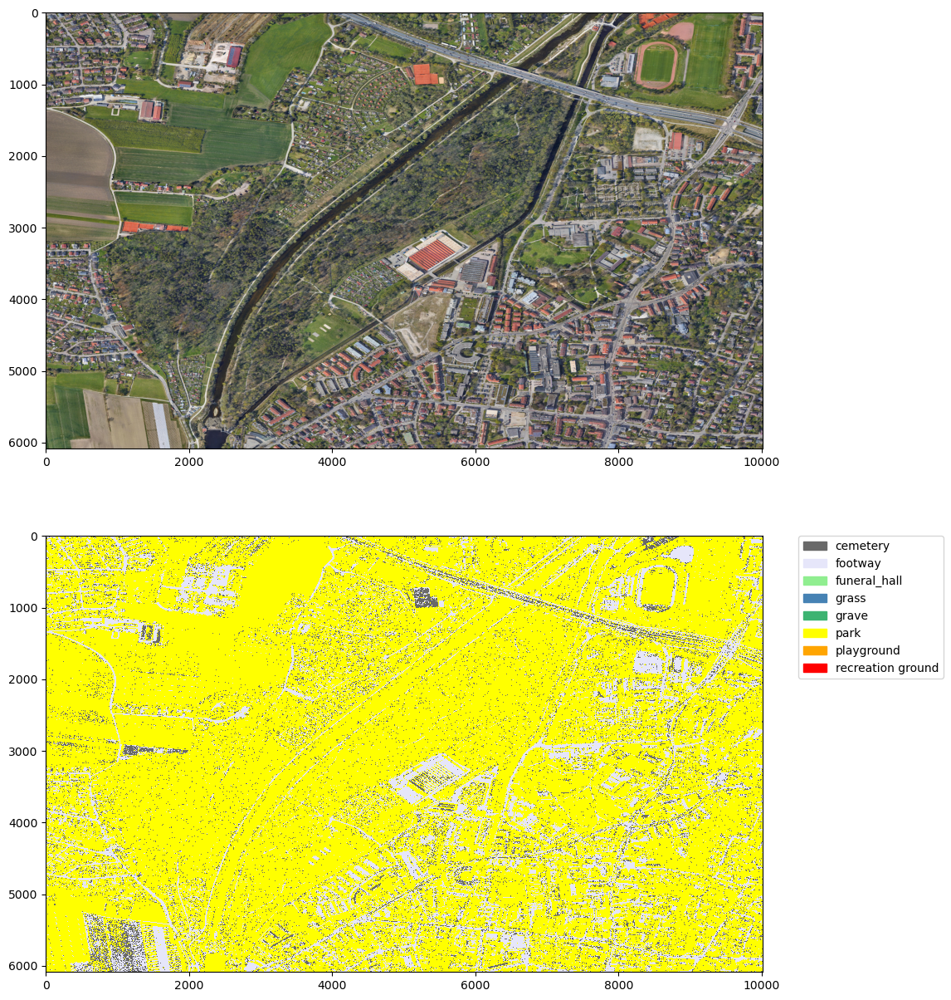

In [50]:
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap

# Define the class labels and their corresponding colors
class_labels = {
    0: "cemetery",
    1: "footway",
    2: "funeral_hall",
    3: "grass",
    4: "grave",
    5: "park",
    6: "playground",
    7: "recreation ground"
}

patches = [mpatches.Patch(color=colors[key], label=class_labels[key]) for key in class_labels]

fig, axs = plt.subplots(2,1,figsize=(20,15))

img_stretched = reshaped_img
axs[0].imshow(img_stretched)

axs[1].imshow(class_prediction, cmap=cmap, interpolation='none')
axs[1].legend(handles=patches, loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

fig.show()

In [52]:
from sklearn.ensemble import RandomForestClassifier
import numpy as np
import rasterio
import matplotlib.pyplot as plt

# Create the Random Forest model
rf = RandomForestClassifier()

# Train the model
rf.fit(X, y)

RandomForestClassifier()

In [53]:
with rasterio.open(img_fp) as src:
    img = src.read()
reshaped_img = reshape_as_image(img)

# Predict the classes using the Random Forest model
class_prediction = rf.predict(reshaped_img.reshape(-1, 3))

# Reshape the classification map for visualization
class_prediction = str_class_to_int(class_prediction) 

In [54]:
def color_stretch(image, index):
    colors = image[:, :, index].astype(np.float64)
    for b in range(colors.shape[2]):
        colors[:, :, b] = rasterio.plot.adjust_band(colors[:, :, b])
    return colors
    
# find the highest pixel value in the prediction image
n = int(np.max(class_prediction))

# next setup a colormap for our map
colors = dict((
    (0, (105, 105, 105, 255)),    # cemetery - dark grey
    (1, (230, 230, 250, 255)),    # funeral hall - pale lavender
    (2, (144, 238, 144, 255)),    # grass - light green
    (3, (70, 130, 180, 255)),     # memorial - deep blue
    (4, (60, 179, 113, 255)),     # park - fresh green
    (5, (255, 255, 0, 255)),      # playground - bright yellow
    (6, (255, 165, 0, 255)),      # recreation ground - bright orange
    (7, (255, 0, 0, 255)),        # buildings - red
))

# Put 0 - 255 as float 0 - 1
for k in colors:
    v = colors[k]
    _v = [_v / 255.0 for _v in v]
    colors[k] = _v
    
index_colors = [colors[key] if key in colors else 
                (255, 255, 255, 0) for key in range(0, n+1)]

cmap = plt.matplotlib.colors.ListedColormap(index_colors, 'Classification', n+1)

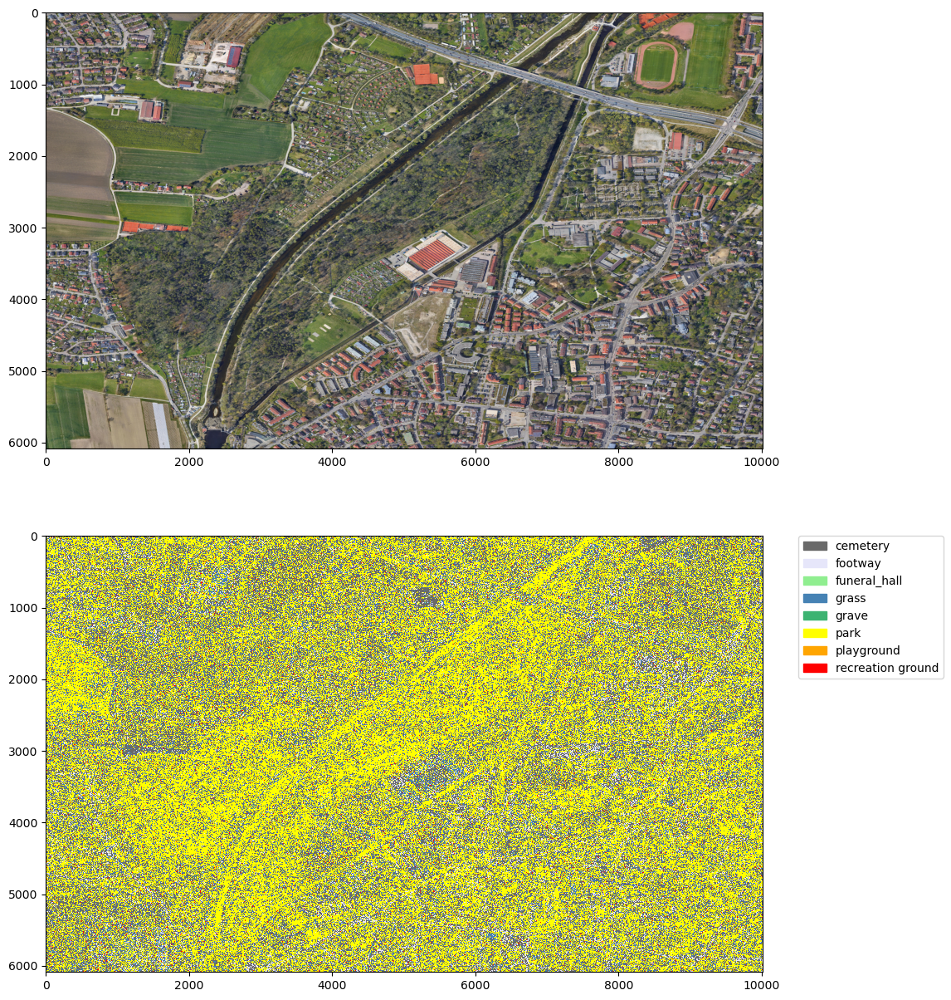

In [55]:
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap

# Assuming reshaped_img is in the correct format
expected_shape = reshaped_img[:, :, 0].shape
class_prediction_2d = class_prediction.reshape(expected_shape)

fig, axs = plt.subplots(2, 1, figsize=(20, 15))

img_stretched = reshaped_img
axs[0].imshow(img_stretched)

# Use the reshaped 2D array for visualization
axs[1].imshow(class_prediction_2d, cmap=cmap, interpolation='none')
axs[1].legend(handles=patches, loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

plt.show()

In [31]:
import geopandas as gpd
import rasterio
from rasterio.mask import mask
from shapely.geometry import mapping

# Load the shapefile
shapefile_path = 'C:/Users/leoni/Documents/Uni/UGS/Project/Funktionert/data/goeggingen_merge.shp'
shapefile = gpd.read_file(shapefile_path)

# Load the RGB ortho image
ortho_image_path = 'C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/goegingen_pro.tif'
with rasterio.open(ortho_image_path) as src:
    ortho_image = src.read()  # Read the RGB bands

In [32]:
from sklearn.preprocessing import LabelEncoder

# Initialize the encoder
label_encoder = LabelEncoder()

# Fit the encoder to the class labels and transform them to integers
shapefile['class_encoded'] = label_encoder.fit_transform(shapefile['class'])

# You can save the mapping of classes to integers if needed
class_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print("Class mapping:", class_mapping)

Class mapping: {'cemetery': 0, 'footway': 1, 'funeral_hall': 2, 'grass': 3, 'grave': 4, 'park': 5, 'playground': 6, 'recreation_ground': 7}


In [33]:
from rasterio.features import rasterize

# Define the output raster's parameters (match the ortho image)
out_shape = (src.height, src.width)
transform = src.transform

# Rasterize the shapefile
# Rasterize the shapefile using the encoded class labels
class_raster = rasterize(
    [(mapping(geom), value) for geom, value in zip(shapefile.geometry, shapefile['class_encoded'])],
    out_shape=out_shape,
    transform=transform,
    #fill=0  # Assuming '0' is the background/nodata class
)

In [34]:
import rasterio
from rasterio.transform import from_origin

# Define the path for the output raster file
class_raster_path = 'C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/class_raster.tif'

# Define the metadata for the new raster file
meta = {
    'driver': 'GTiff',  # GeoTIFF format
    'dtype': 'int32',  # Adjust dtype according to your needs, int32 is common for class labels
    'nodata': 0,  # Define the nodata value, ensure it matches your fill value in rasterize
    'width': out_shape[1],
    'height': out_shape[0],
    'count': 1,  # Number of bands, 1 for a class label raster
    'crs': src.crs,  # CRS from your original ortho image raster
    'transform': transform  # Transform from your original ortho image raster
}

# Write the class_raster to a new raster file
with rasterio.open(class_raster_path, 'w', **meta) as dst:
    dst.write(class_raster, 1)  # Write class_raster to the first band

In [35]:
from sklearn.model_selection import train_test_split

# Split shapefile into training and validation sets
train_shapefile, val_shapefile = train_test_split(shapefile, test_size=0.2)

In [36]:
import numpy as np
import rasterio
from rasterio.mask import mask
from shapely.geometry import mapping

def extract_features_labels(shapefile, raster_path, class_raster_path):
    X, y = [], []
    with rasterio.open(raster_path) as src, rasterio.open(class_raster_path) as class_raster:
        src_nodata = src.nodata
        class_nodata = class_raster.nodata if class_raster.nodata is not None else 0

        for geom in shapefile.geometry:
            # Mask the ortho image raster and class raster with the current geometry
            out_image, _ = mask(src, [mapping(geom)], crop=True)
            out_labels, _ = mask(class_raster, [mapping(geom)], crop=True)

            # Convert to numpy arrays, ensuring compatibility
            out_image = np.array(out_image)
            out_labels = np.array(out_labels)

            # Debugging: Check shapes and types after conversion
            print("Converted Out Image Shape:", out_image.shape, "Type:", type(out_image))
            print("Converted Out Labels Shape:", out_labels.shape, "Type:", type(out_labels))

            # Create a valid mask and apply it in a controlled manner
            valid_mask = (out_image[0] != src_nodata) & (out_labels[0] != class_nodata)
            for band in range(out_image.shape[0]):
                band_data = out_image[band][valid_mask]
                if band == 0:  # For the first band, initialize the X array for this geometry
                    geom_X = np.empty((band_data.size, out_image.shape[0]))
                geom_X[:, band] = band_data  # Fill data for the current band
            X.append(geom_X)
            y.extend(out_labels[0][valid_mask])

    return np.concatenate(X), np.array(y)

# Paths
ortho_image_path = 'C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/goegingen_pro.tif'
class_raster_path = 'C:/Users/leoni/Documents/Uni/UGS/Project/Classification_data/Imagery/class_raster.tif'

# Extract features and labels
X_train, y_train = extract_features_labels(train_shapefile, ortho_image_path, class_raster_path)
X_val, y_val = extract_features_labels(val_shapefile, ortho_image_path, class_raster_path)

Converted Out Image Shape: (3, 10, 14) Type: <class 'numpy.ndarray'>
Converted Out Labels Shape: (1, 10, 14) Type: <class 'numpy.ndarray'>
Converted Out Image Shape: (3, 8, 36) Type: <class 'numpy.ndarray'>
Converted Out Labels Shape: (1, 8, 36) Type: <class 'numpy.ndarray'>
Converted Out Image Shape: (3, 10, 12) Type: <class 'numpy.ndarray'>
Converted Out Labels Shape: (1, 10, 12) Type: <class 'numpy.ndarray'>
Converted Out Image Shape: (3, 670, 1736) Type: <class 'numpy.ndarray'>
Converted Out Labels Shape: (1, 670, 1736) Type: <class 'numpy.ndarray'>
Converted Out Image Shape: (3, 6, 86) Type: <class 'numpy.ndarray'>
Converted Out Labels Shape: (1, 6, 86) Type: <class 'numpy.ndarray'>
Converted Out Image Shape: (3, 15, 23) Type: <class 'numpy.ndarray'>
Converted Out Labels Shape: (1, 15, 23) Type: <class 'numpy.ndarray'>
Converted Out Image Shape: (3, 139, 65) Type: <class 'numpy.ndarray'>
Converted Out Labels Shape: (1, 139, 65) Type: <class 'numpy.ndarray'>
Converted Out Image Sha

In [37]:
X_val

array([[170., 162., 159.],
       [174., 166., 163.],
       [182., 172., 170.],
       ...,
       [115., 113.,  88.],
       [104., 102.,  79.],
       [ 90.,  91.,  57.]])

In [39]:
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# Adjusting labels to start from 0
y_train_adj = y_train - 1
y_val_adj = y_val - 1

# Train Random Forest
#rf = RandomForestClassifier()
#rf.fit(X_train, y_train_adj)

# Train XGBoost
xgb = XGBClassifier()
xgb.fit(X_train, y_train_adj)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [40]:
from sklearn.metrics import accuracy_score

# Predict with Random Forest
#y_pred_rf = rf.predict(X_val)
#print("Random Forest Accuracy:", accuracy_score(y_val, y_pred_rf))

# Predict with XGBoost
y_pred_xgb = xgb.predict(X_val)
print("XGBoost Accuracy:", accuracy_score(y_val, y_pred_xgb))

XGBoost Accuracy: 0.006842899979344876


In [41]:
import rasterio
import numpy as np

# Open the RGB image
with rasterio.open(ortho_image_path) as src:
    # Read the image data
    img = src.read()  # Assuming the image has 3 bands corresponding to RGB
    # Reshape the image data for prediction: flatten spatial dimensions while preserving bands
    img_reshaped = img.reshape(img.shape[0], -1).T  # Transpose to have shape (n_samples, n_bands)

# Make predictions with the chosen model (e.g., Random Forest or XGBoost)
y_pred = xgb.predict(img_reshaped)  # Use rf or xgb depending on which model you want to use

In [42]:
# Assuming `img` is the variable holding the read image data (as in the previous step)
# img.shape would be (num_bands, height, width)

# Reshape the predictions to match the original image's spatial dimensions
pred_reshaped = y_pred.reshape(img.shape[1], img.shape[2])

# Write the predictions to a new raster file
with rasterio.open(
    'prediction.tif', 'w',
    driver='GTiff',
    height=pred_reshaped.shape[0],
    width=pred_reshaped.shape[1],
    count=1,  # Single band for predicted classes
    dtype=pred_reshaped.dtype,
    crs=src.crs,
    transform=src.transform,
) as dst:
    dst.write(pred_reshaped, 1)

In [43]:
y_pred

array([0, 4, 4, ..., 0, 0, 0], dtype=int64)

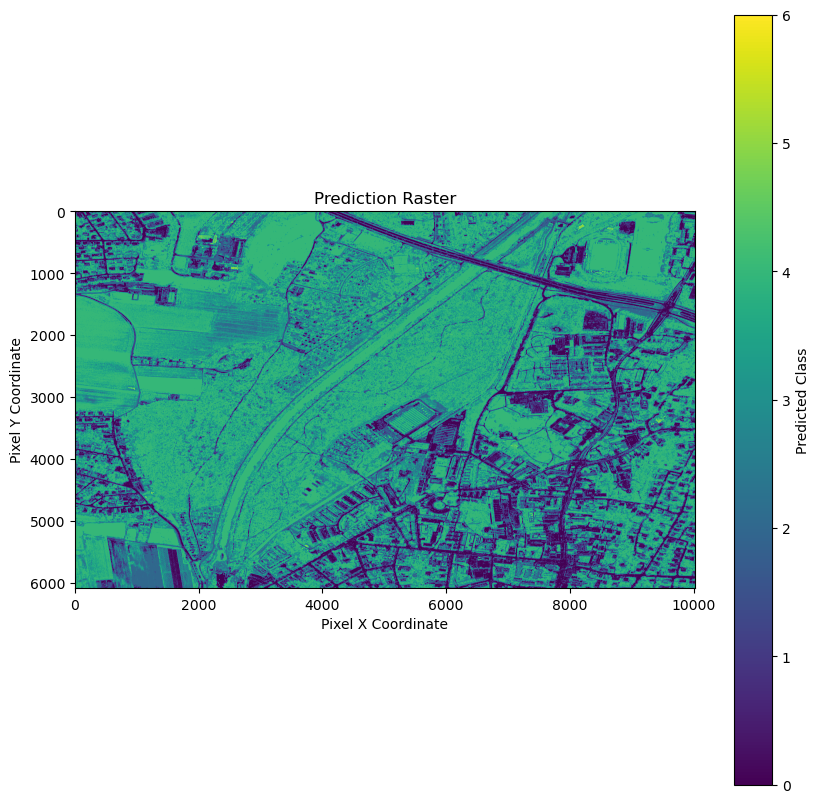

In [44]:
# Plot the prediction raster
plt.figure(figsize=(10, 10))  # Adjust the figure size as needed
plt.imshow(pred_reshaped, cmap='viridis')  # Choose a colormap that suits your data ('viridis', 'jet', etc.)
plt.colorbar(label='Predicted Class')  # Show color scale
plt.title('Prediction Raster')
plt.xlabel('Pixel X Coordinate')
plt.ylabel('Pixel Y Coordinate')
plt.show()

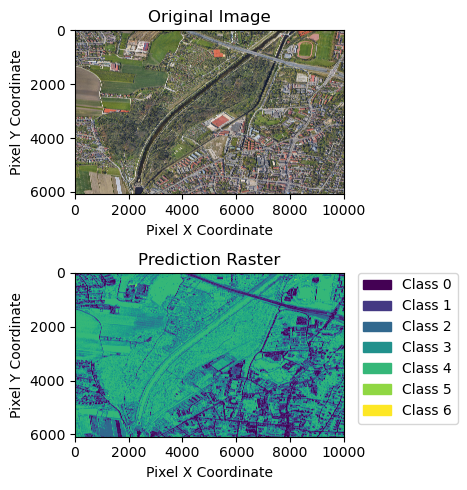

In [45]:
rgb = np.rollaxis(img, 0, 3)  # This moves the first axis (bands) to the last position

plt.figure(figsize=(10, 5))
plt.subplot(2, 1, 1)  # 1 row, 2 columns, 1st subplot
plt.imshow(rgb)
plt.title('Original Image')
plt.xlabel('Pixel X Coordinate')
plt.ylabel('Pixel Y Coordinate')

from matplotlib.patches import Patch

# Plot the prediction raster
plt.subplot(2, 1, 2)  # 1 row, 2 columns, 2nd subplot
prediction_plot = plt.imshow(pred_reshaped, cmap='viridis')  # Ensure cmap is the same as used before

# Create a custom legend
# Generate a list of unique labels in your prediction raster
unique_labels = np.unique(pred_reshaped)
# Create a list of colors from the colormap used for each unique label
colors = [prediction_plot.cmap(prediction_plot.norm(label)) for label in unique_labels]
# Create a list of patches for the legend
patches = [Patch(color=colors[i], label=f"Class {label}") for i, label in enumerate(unique_labels)]
plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.title('Prediction Raster')
plt.xlabel('Pixel X Coordinate')
plt.ylabel('Pixel Y Coordinate')

plt.tight_layout()  # Adjust layout to not overlap
plt.show()

Class mapping: 'cemetery': 0, 'footway': 1, 'funeral_hall': 2, 'grass': 3, 'grave': 4, 'park': 5, 'playground': 6, 'recreation_ground': 7

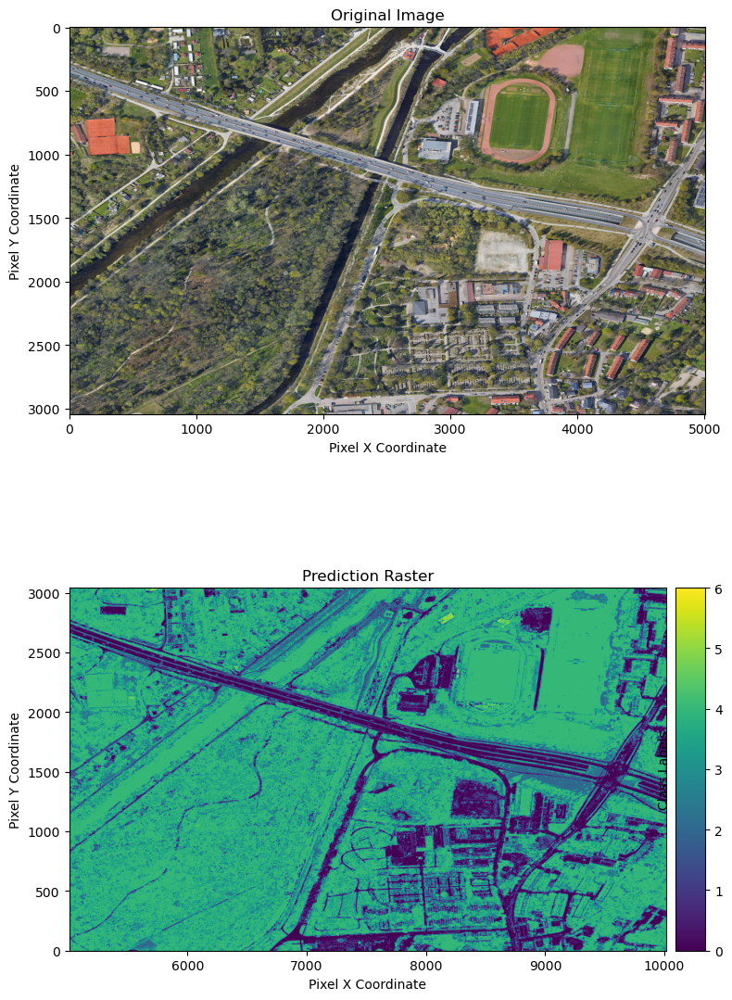

In [46]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable  # Import make_axes_locatable

# Define the size of the figure
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 12))

# Define the coordinates for the right upper quarter
x_min, x_max = int(pred_reshaped.shape[1] / 2), pred_reshaped.shape[1]
y_min, y_max = 0, int(pred_reshaped.shape[0] / 2)

# Plot the original RGB image (subset)
ax1.imshow(rgb[y_min:y_max, x_min:x_max])
ax1.set_title('Original Image')
ax1.set_xlabel('Pixel X Coordinate')
ax1.set_ylabel('Pixel Y Coordinate')

# Plot the prediction raster (subset)
prediction_plot = ax2.imshow(pred_reshaped[y_min:y_max, x_min:x_max], cmap='viridis', extent=[x_min, x_max, y_min, y_max])
ax2.set_title('Prediction Raster')
ax2.set_xlabel('Pixel X Coordinate')
ax2.set_ylabel('Pixel Y Coordinate')

# Create a divider to position the colorbar for the prediction raster
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.1)

# Add a colorbar for the prediction raster
colorbar = plt.colorbar(prediction_plot, cax=cax)
colorbar.set_label('Class Labels')
cax.yaxis.set_label_position('left')  # Position colorbar labels to the left

plt.tight_layout()
plt.show()

In [47]:
import shap

explainer = shap.TreeExplainer(xgb)  # xgb ist Ihr trainiertes XGBoost-Modell
shap_values = explainer.shap_values(X_val)  # X_val sind Ihre Validierungsdaten

[11:57:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


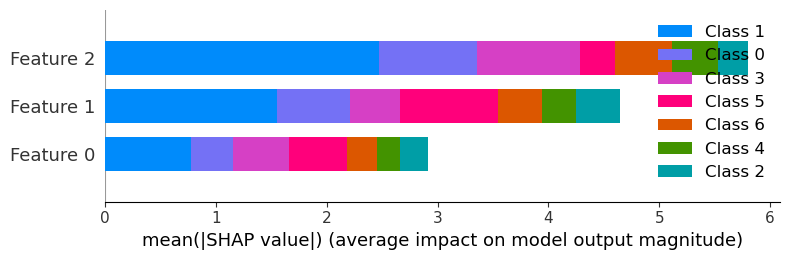

In [48]:
shap.summary_plot(shap_values, X_val)

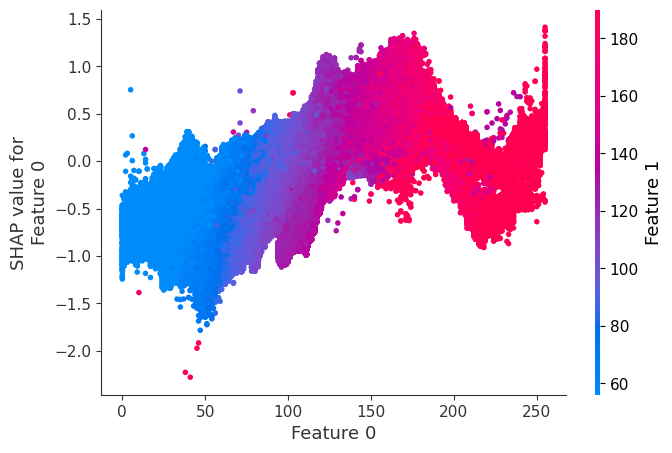

In [62]:
shap.deps[0], X_val)endence_plot("Feature 0", shap_value

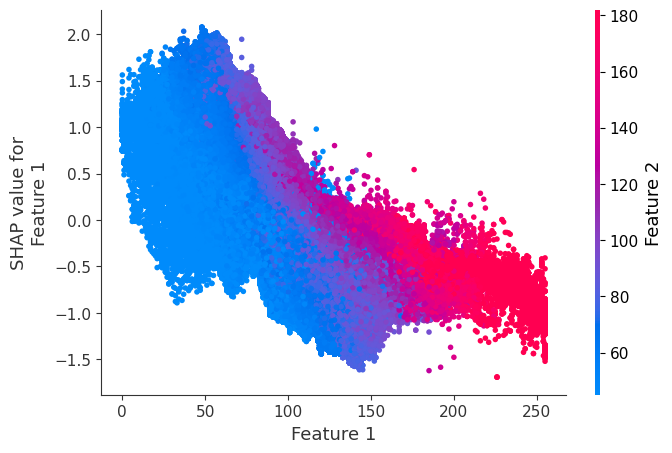

In [63]:
shap.dependence_plot("Feature 1", shap_values[0], X_val)

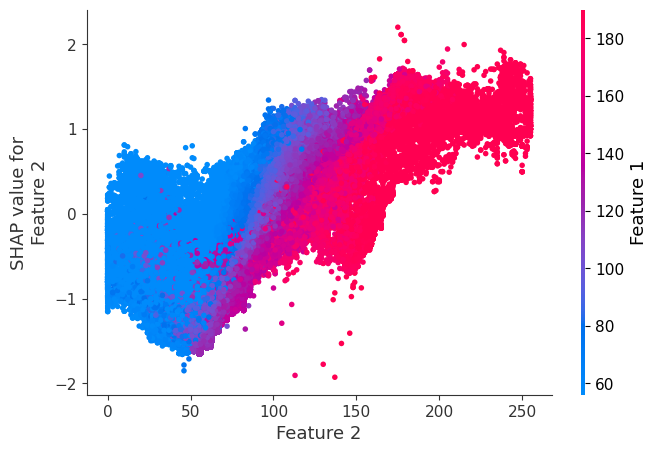

In [64]:
shap.dependence_plot("Feature 2", shap_values[0], X_val)

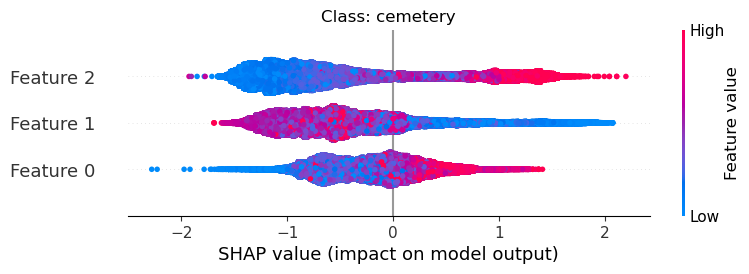

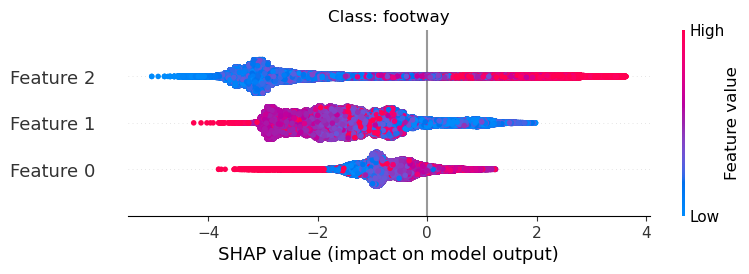

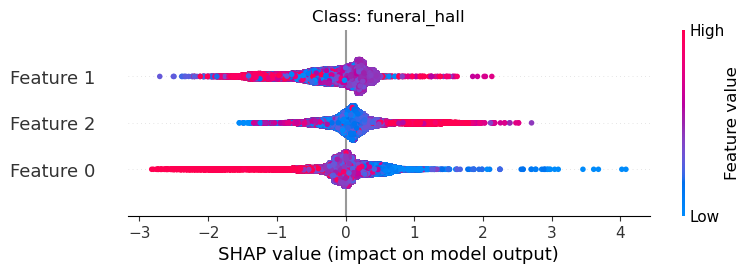

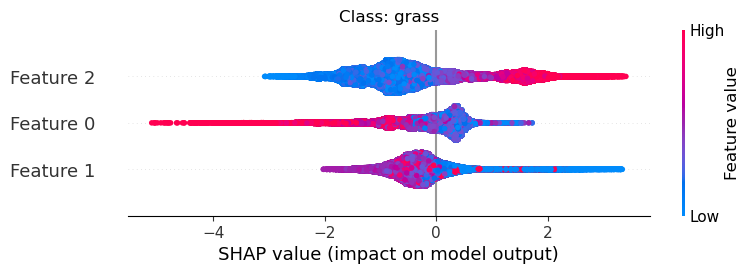

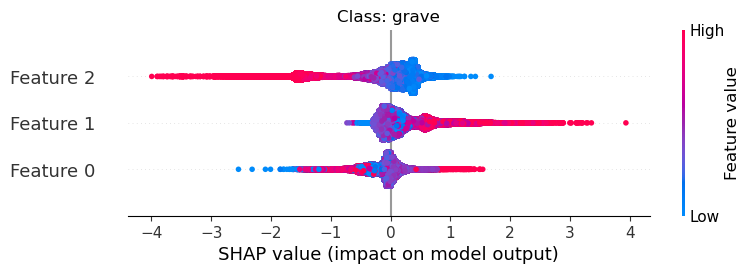

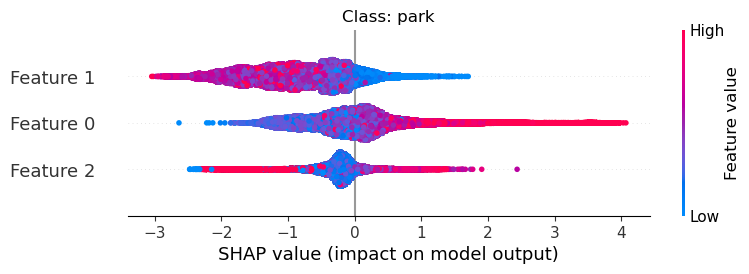

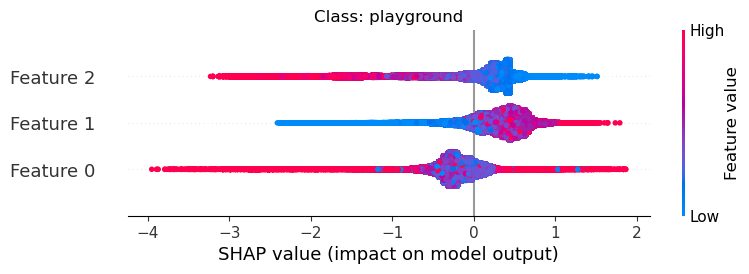

In [70]:
import matplotlib.pyplot as plt

# Class names mapping
class_names = {
    0: 'cemetery',
    1: 'footway',
    2: 'funeral_hall',
    3: 'grass',
    4: 'grave',
    5: 'park',
    6: 'playground',
    7: 'recreation_ground'
}

# Loop through each set of SHAP values and plot with class names
for i, shap_values_for_output in enumerate(shap_values):
    class_name = class_names.get(i, f"Output {i}")  # Get class name, default to "Output {i}" if not found

    plt.figure()
    shap.summary_plot(shap_values_for_output, X_val, show=False)
    plt.title(f"Class: {class_name}")
    plt.show()

Summary plot for class 'cemetery' (Bar Plot):


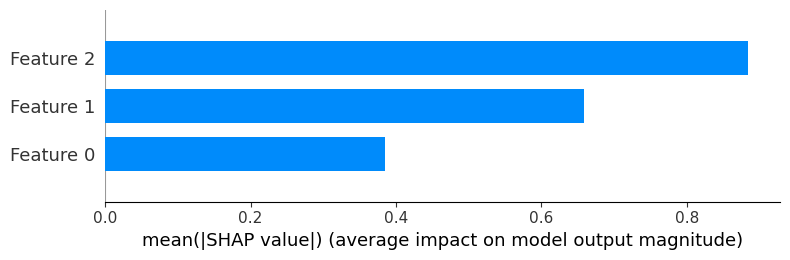

Summary plot for class 'cemetery' (Dot Plot):


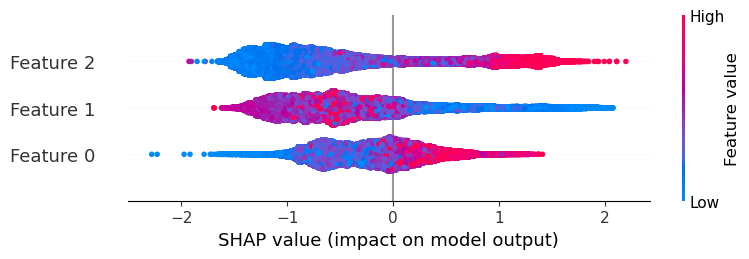

Summary plot for class 'footway' (Bar Plot):


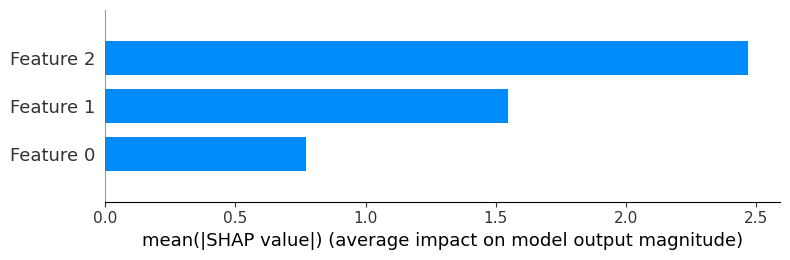

Summary plot for class 'footway' (Dot Plot):


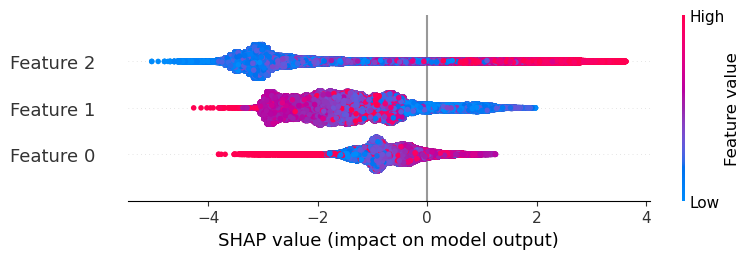

Summary plot for class 'funeral_hall' (Bar Plot):


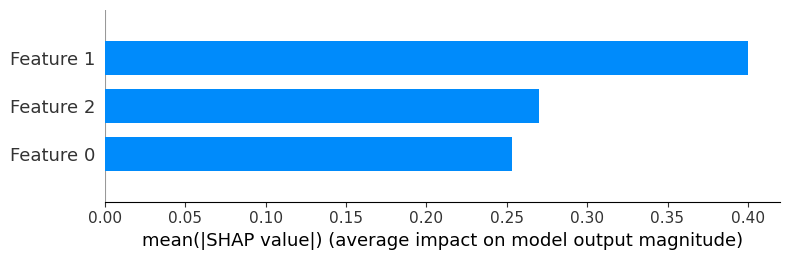

Summary plot for class 'funeral_hall' (Dot Plot):


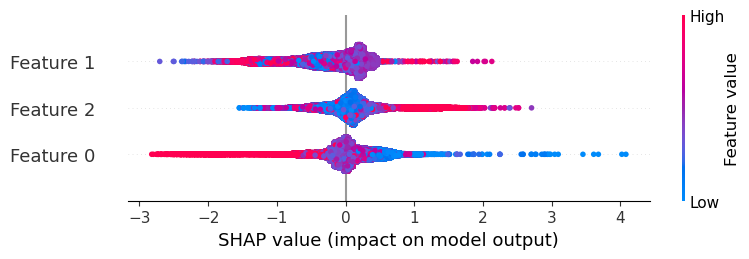

Summary plot for class 'grass' (Bar Plot):


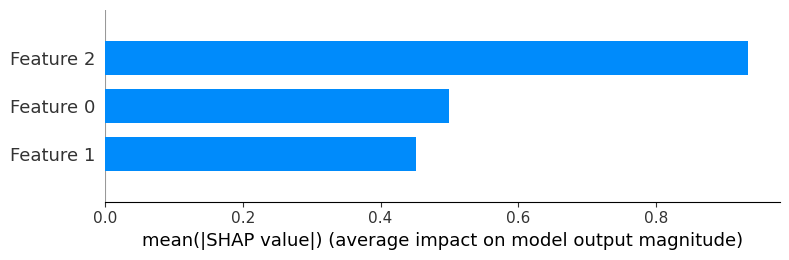

Summary plot for class 'grass' (Dot Plot):


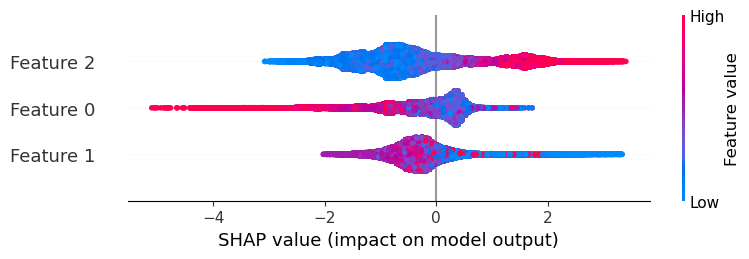

Summary plot for class 'grave' (Bar Plot):


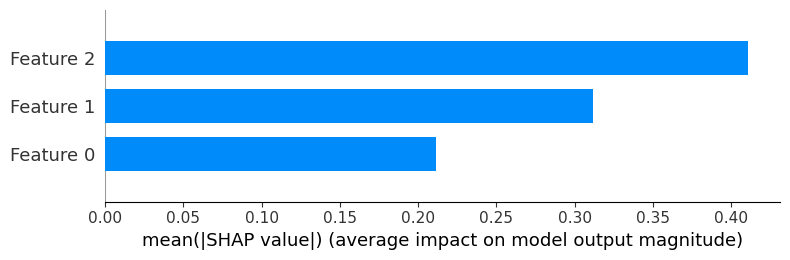

Summary plot for class 'grave' (Dot Plot):


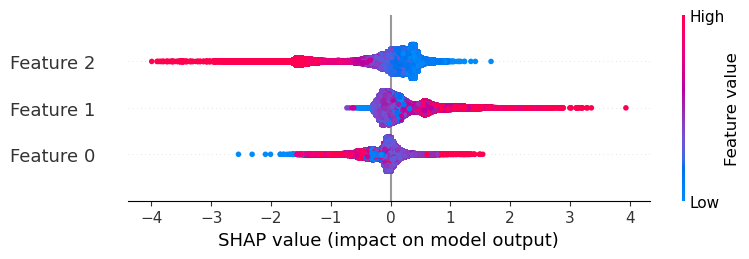

Summary plot for class 'park' (Bar Plot):


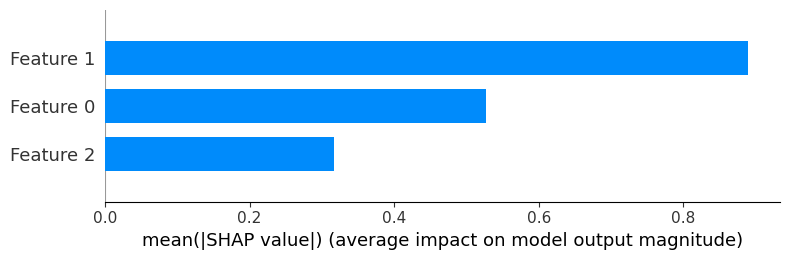

Summary plot for class 'park' (Dot Plot):


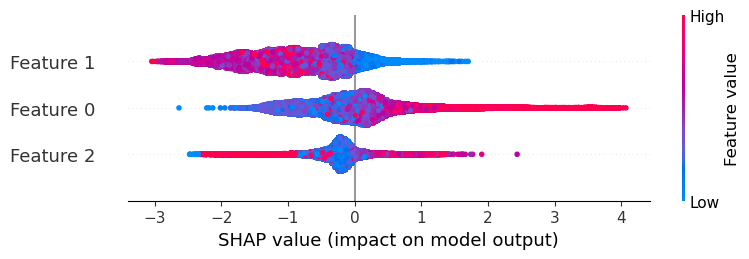

Summary plot for class 'playground' (Bar Plot):


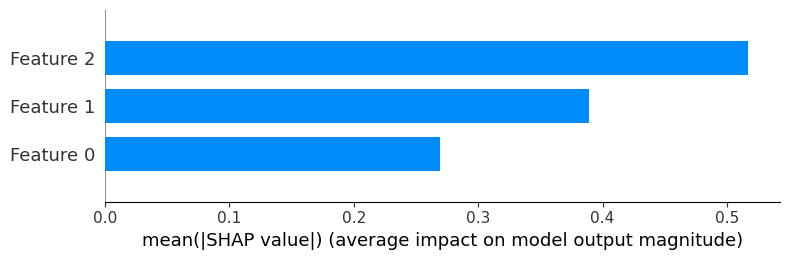

Summary plot for class 'playground' (Dot Plot):


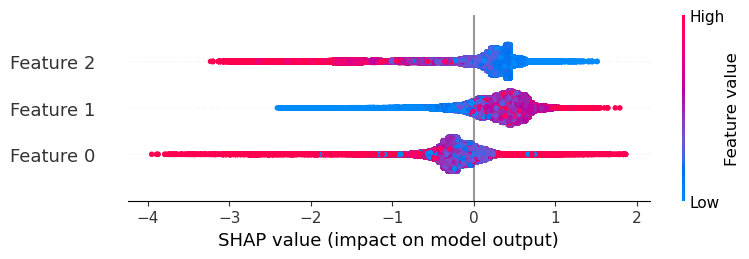

In [69]:
# Class names mapping
class_names = {
    0: 'cemetery',
    1: 'footway',
    2: 'funeral_hall',
    3: 'grass',
    4: 'grave',
    5: 'park',
    6: 'playground',
    7: 'recreation_ground'
}

# Loop through each set of SHAP values and plot with class names
for i, shap_values_for_output in enumerate(shap_values):
    class_name = class_names.get(i, f"Output {i}")  # Get class name, default to "Output {i}" if not found

    print(f"Summary plot for class '{class_name}' (Bar Plot):")
    shap.summary_plot(shap_values_for_output, X_val, plot_type="bar", title=f"Class: {class_name} - Bar Plot")

    print(f"Summary plot for class '{class_name}' (Dot Plot):")
    shap.summary_plot(shap_values_for_output, X_val, plot_type="dot", title=f"Class: {class_name} - Dot Plot")